Conducting EDA on US top charting songs from 1921- 2020 to examine relationship between variables and other patterns in the data.

## Exploratory Data Analysis (EDA)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.graph_objects as go

from scipy.stats import pearsonr
from sklearn.feature_extraction.text import CountVectorizer

# shows plots inline
%matplotlib inline

In [2]:
# To suppress future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)



In [3]:
df=pd.read_csv('/Users/josephlim/Desktop/Data Science/Capstone Projects/Capstone project- Spotify/Capstone 2- Data Wrangling/US_1921-2021_final.csv')

In [4]:
df.head()

,popularity,duration_ms,year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0.06,126903.0,1922,0.645,0.4450,0.0,-13.338,1.0,0.4510,0.674,0.7440,0.151,0.127,104.851,3.0
1,0.00,98200.0,1922,0.695,0.2630,0.0,-22.136,1.0,0.9570,0.797,0.0000,0.148,0.655,102.009,1.0
2,0.00,181640.0,1922,0.434,0.1770,1.0,-21.180,1.0,0.0512,0.994,0.0218,0.212,0.457,130.418,5.0
3,0.00,176907.0,1922,0.321,0.0946,7.0,-27.961,1.0,0.0504,0.995,0.9180,0.104,0.397,169.980,3.0
4,0.00,163080.0,1922,0.402,0.1580,3.0,-16.900,0.0,0.0390,0.989,0.1300,0.311,0.196,103.220,4.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 587927 entries, 0 to 587926
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   popularity        587927 non-null  float64
 1   duration_ms       587923 non-null  float64
 2   year              587927 non-null  int64  
 3   danceability      587923 non-null  float64
 4   energy            587923 non-null  float64
 5   key               587923 non-null  float64
 6   loudness          587923 non-null  float64
 7   mode              587923 non-null  float64
 8   speechiness       587923 non-null  float64
 9   acousticness      587923 non-null  float64
 10  instrumentalness  587923 non-null  float64
 11  liveness          587923 non-null  float64
 12  valence           587923 non-null  float64
 13  tempo             587923 non-null  float64
 14  time_signature    587923 non-null  float64
dtypes: float64(14), int64(1)
memory usage: 67.3 MB


### Spotify Audio Features

Spotify provides breaks down its track data using its audio features. The Spotify Web API developer guide defines them as follows:
- Duration: The duration of the track in milliseconds.
- Danceability: Describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.
- Energy: Represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale.
- Key: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.
- Loudness: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks.
- Mode: Indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.
- Speechiness: This detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value.
- Acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic.
- Instrumentalness: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”.
- Liveness: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live.
- Valence: Describes the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).
- Tempo: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece, and derives directly from the average beat duration.
- Time signature: An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).



First of all, no one talks about the durations of songs in ms. Let's convert them into to seconds.

In [6]:
def convert_mstosec(ms_input):
    sec_output= ms_input/1000
    return sec_output

In [7]:
df['duration']= df['duration_ms'].apply(lambda x: convert_mstosec(x))

In [8]:
df['duration']

0         126.903
1          98.200
2         181.640
3         176.907
4         163.080
           ...   
587922    185.487
587923    214.707
587924    215.627
587925    199.112
587926    149.190
Name: duration, Length: 587927, dtype: float64

In [9]:
df.drop('duration_ms', axis=1, inplace=True)

Also, because the term "mode" can be confusing given the context of statistical analysis, it will be referred to as "musical mode"(m_mode)

In [10]:
df_m= df.rename(columns={'mode':'m_mode'})

### Distributions of Data
#### Categorical features
There are two categorical features in this datasets: key and mode. 

In [11]:
df_cat=df_m[['key','m_mode']].copy()

In [12]:
df_cat.head()

,key,m_mode
0,0.0,1.0
1,0.0,1.0
2,1.0,1.0
3,7.0,1.0
4,3.0,0.0


Keys are denoted as numbers.0 represents C, and each index represents a semitone increase in key. Musical mode is also denoted as integers, but it is a binary data that indicates whether the song is a major/ minor key. 0 represents minor keys, while 1 represents major.

Values will be replaced to reflect corresponding categories.

In [13]:
df_m['key'].replace({0:'C',1:'C#', 2:'D', 3:'D#', 4:'E', 5:'F', 6:'F#',7:'G',8:'Ab', 9:'A', 10:'Bb',11:'B'}, inplace=True)
df_m['m_mode'].replace({0:'minor',1:'major'}, inplace=True)


df_cat['key'].replace({0:'C',1:'C#', 2:'D', 3:'D#', 4:'E', 5:'F', 6:'F#',7:'G',8:'Ab', 9:'A', 10:'Bb',11:'B'}, inplace=True)
df_cat['m_mode'].replace({0:'minor',1:'major'}, inplace=True)

In [14]:
df_cat['key'].value_counts()

C     75105
G     73841
D     66625
A     65184
F     53666
E     48331
C#    41928
B     39261
Bb    37757
Ab    33617
F#    30992
D#    21616
Name: key, dtype: int64

In [15]:
key_order= ['C','C#','D','D#', 'E', 'F','F#','G', 'Ab','A','Bb','B' ]

<AxesSubplot: xlabel='key', ylabel='count'>

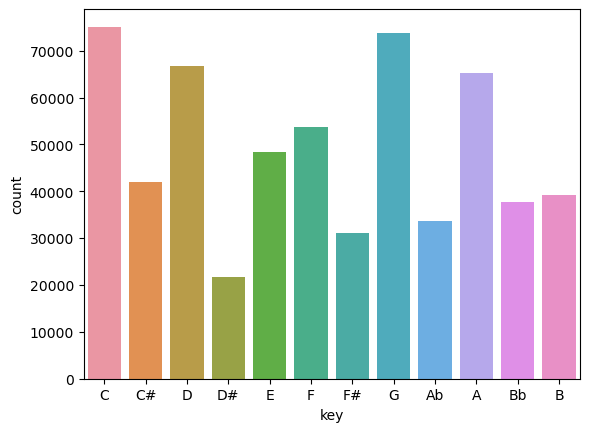

In [16]:
sns.countplot(data=df_cat, order= key_order,x='key')

The most common keys are C and G.

In [17]:
df_cat['m_mode'].value_counts()

major    387273
minor    200650
Name: m_mode, dtype: int64

<AxesSubplot: xlabel='m_mode', ylabel='count'>

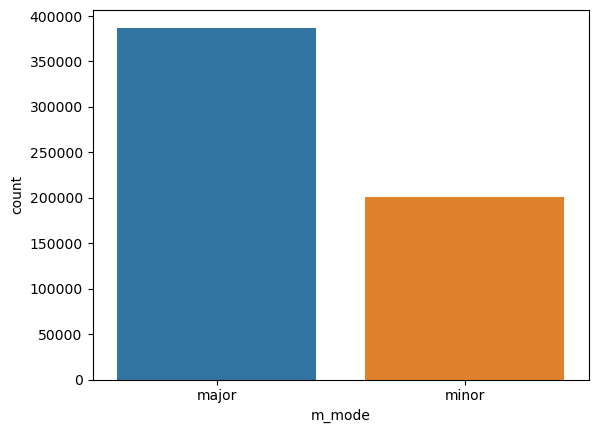

In [18]:
sns.countplot(data= df_cat, x='m_mode')

There are more songs that are major keys.

#### Quantitative data

We will now conduct analysis on numerical features of the dataset.

In [19]:
# Filtering numerical data.
cat_columns= df_cat.columns
df_num= df_m.drop(cat_columns, axis=1)

In [20]:
df_num.columns

Index(['popularity', 'year', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'duration'],
      dtype='object')

In [21]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,587927.0,0.276178,0.184284,0.000,0.1300,0.270000,0.41000,1.000
year,587927.0,1988.635402,22.855973,1900.000,1974.0000,1992.000000,2007.00000,2021.000
danceability,587923.0,0.563846,0.166121,0.000,0.4530,0.578000,0.68600,0.991
energy,587923.0,0.542219,0.251788,0.000,0.3440,0.549000,0.74800,1.000
loudness,587923.0,-10.197521,5.088159,-60.000,-12.8810,-9.232000,-6.47500,5.376
speechiness,587923.0,0.104846,0.179737,0.000,0.0340,0.044300,0.07650,0.971
acousticness,587923.0,0.449443,0.348759,0.000,0.0967,0.421000,0.78400,0.996
instrumentalness,587923.0,0.113215,0.266635,0.000,0.0000,0.000024,0.00943,1.000
liveness,587923.0,0.213859,0.184237,0.000,0.0982,0.139000,0.27800,1.000
valence,587923.0,0.552229,0.257638,0.000,0.3460,0.564000,0.76900,1.000


It says our data starts from 1900. Let's examine that data.

In [22]:
df_1900= df_num[df_num['year']==1900]
df_1900.head()

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
478627,0.19,1900,0.659,0.791,-4.895,0.0295,0.139,0.000002,0.161,0.956,141.999,4.0,233.92


Okay, we only have one song from 1900.

In [23]:
df_num.shape

(587927, 13)

In [24]:
df_num.sort_values('popularity', ascending=False)

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
93802,1.000000,2021,0.677,0.696,-6.181,0.1190,0.3210,0.000000,0.4200,0.4640,90.030,4.0,198.082
586672,0.999203,2021,0.604,0.366,-7.519,0.0282,0.5780,0.000000,0.1330,0.1300,141.981,4.0,224.695
586673,0.998406,2021,0.591,0.764,-5.484,0.0483,0.0383,0.000000,0.1030,0.4780,169.928,4.0,141.806
586674,0.997610,2021,0.736,0.704,-7.409,0.0615,0.0203,0.000000,0.0501,0.8940,149.995,4.0,212.000
586675,0.996813,2021,0.761,0.525,-6.900,0.0944,0.4400,0.000007,0.0921,0.5310,80.870,4.0,238.805
...,...,...,...,...,...,...,...,...,...,...,...,...,...
132583,0.000000,1924,0.787,0.340,-9.113,0.0796,0.9590,0.075900,0.2360,0.8120,109.139,4.0,177.890
132582,0.000000,1924,0.270,0.228,-19.269,0.0601,0.9920,0.925000,0.2780,0.4970,188.105,4.0,166.631
132581,0.000000,1924,0.638,0.570,-5.116,0.0331,0.9960,0.192000,0.2930,0.7290,106.267,4.0,188.783
132580,0.000000,1924,0.646,0.508,-3.748,0.0284,0.9500,0.067100,0.0640,0.6780,102.941,4.0,194.164


Let's first observe how different audio features changed throughout time.

## Audio Features Throughout Time

In [25]:
num_features=df_num.columns.tolist()

In [26]:
audio_features= [x for x in num_features if x not in ['popularity','year','loudness','speechiness','tempo','time_signature', 'duration']]

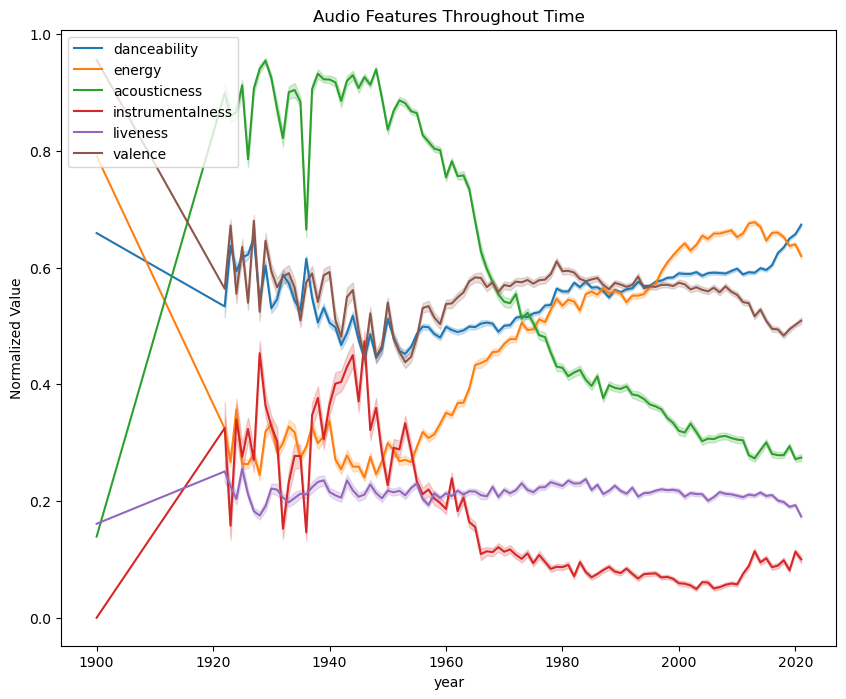

In [27]:
plt.figure(figsize=(10,8))

for i in audio_features:
    sns.lineplot(data=df_num, x='year', y=i, label= str(i))
    
plt.ylabel('Normalized Value')
plt.title('Audio Features Throughout Time')
plt.legend(loc= 'upper left')

Songs were high in acousticness around the 1920s-1950s. The acousticness started showing downward trend from then on. Valence and danceability values show close resemblance through the 1920s-1960s. They then show slight divergence, but both with upward trends until the 1990s. Valence and danceability then shows another divergence, with danceability increasing, while valence decreasing. Energy remains consistent throughout the 1920s-1950s, staying around 0.3. It then experienced constant upward trend until 2020s. Liveness stays consistent around 0.2 throughout the 1920s-2020s. Instrumentalness hovers around 0.2-0.4 between the 1920-1950, then decreases until the 1970s, then stays around 0.1 until 2020.

### Data Distributions

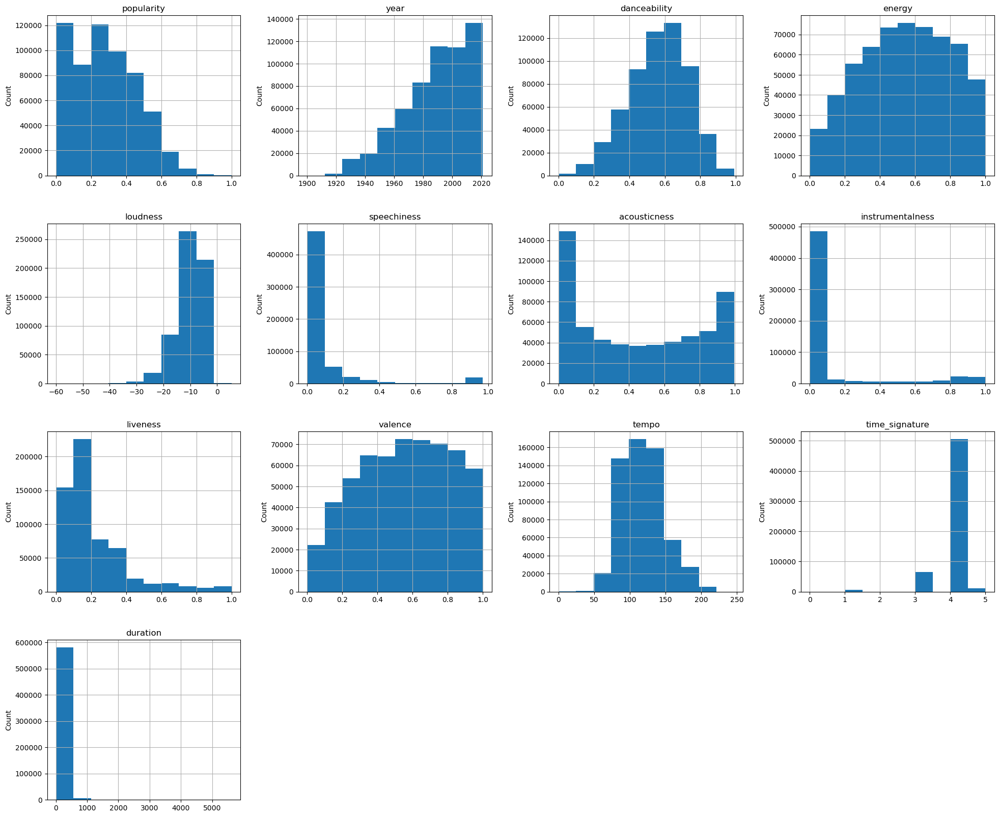

In [28]:
hist= df_num.hist(bins=10, figsize=(24,20))
for i, ax in enumerate(hist.ravel()):
    ax.set_ylabel('Count')

- Energy and valence have noticeably similar distribution. Danceability, loudness, and energy have similar distribution. 

- Most top charting songs tend to be short in duration. They tend to have high energy and loudness, around 0.6 and -10dB, respectively. 
- Most top charting tracks also tend to contain musical vocals(such as singing or rapping),rather than spoken words (as heard in audio books).  
- They also scored low "liveness", which means they are often polished studio recordings than live performances.
- There is lower likelihood that top charting songs are acoustic.
- In terms of valence, the highest distribution was seen between 0.25 and 0.75. 
- Similarly, the highest distribution in danceability was in between 0.5-0.75. 
- The largest tempo distribution in top charting songswas in between 90 to 150 BPM.

#### More in-depth look at individual features:

Text(0.5, 0, 'Seconds')

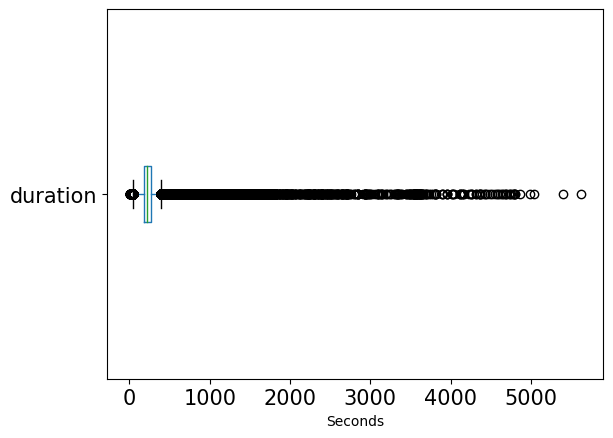

In [29]:
boxplot_dur= df_num.boxplot(column='duration', grid=False, vert=False, fontsize=15)
boxplot_dur.set_xlabel('Seconds')

In [30]:
mean= df_num['duration'].mean()
q25, q75= np.nanpercentile(df_num['duration'],[25,75])
iqr= np.subtract(q75,q25)
maximum= q75+ 1.5*iqr

print('mean:',mean)
print('maximum', maximum)

mean: 229.9857520525647
maximum 396.79949999999997


In [31]:
outliers= df_num[df_num['duration']>maximum]
percentage_outlier= (len(outliers)/ len(df_num))*100


print('Outliers:',len(outliers))
print('Outlier Proportion:', percentage_outlier)

Outliers: 25330
Outlier Proportion: 4.308358010433268


Top charting songs have mean length of 229.986 sec. Of 587927 songs, 4% of songs(25330 songs) were longer than 396.799 sec. 

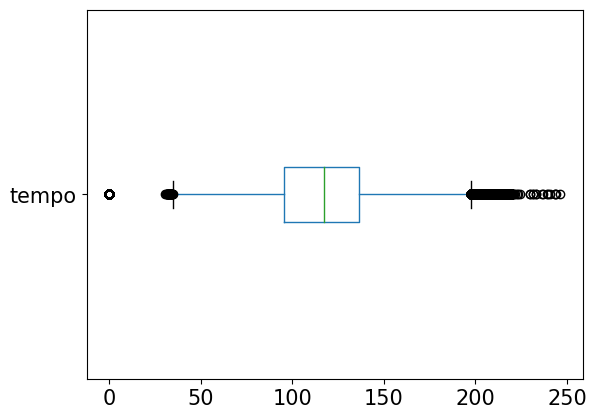

In [32]:
boxplot_tempo= df_num.boxplot(column='tempo', grid=False, vert=False, fontsize=15)

In [33]:
mean= df_num['tempo'].mean()


q25,q75= np.nanpercentile(df_num['tempo'],[25,75])
iqr= np.subtract(q75,q25)
maximum= q75+ 1.5*iqr

print('mean:',mean)
print('maximum', maximum)

mean: 118.4802699231022
maximum 197.4625


In [34]:
outliers= df_num[df_num['tempo']>maximum]
percentage_outlier= (len(outliers)/ len(df_num))*100


print('Outliers:',len(outliers))
print('Outlier Proportion:', percentage_outlier)

Outliers: 5324
Outlier Proportion: 0.9055546011664714


Top charting songs tend to be medium or faster tempo, with mean tempo of around 118 BPM.  Of 587927 songs, 0.906% of songs(5324 songs) were faster than 197 BPM. 

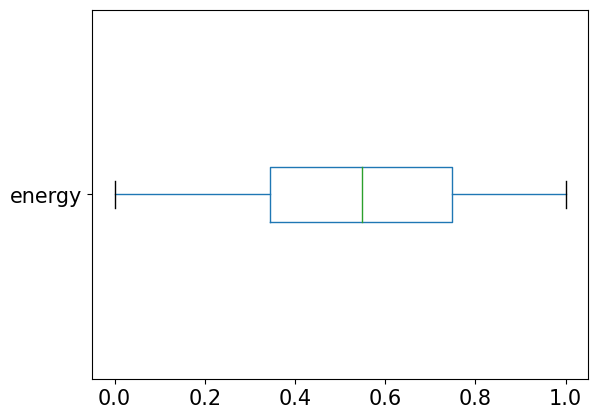

In [35]:
boxpolot_E= df_num.boxplot(column='energy', grid=False, vert=False, fontsize=15)

In [36]:
mean= df_num['energy'].mean()
mode= df_num['energy'].mode()
q25,q75= np.nanpercentile(df_num['energy'],[25,75])
iqr= np.subtract(q75,q25)
minimum= q25- 1.5*iqr
maximum= q75+ 1.5*iqr

print('mean:',mean)
print('minimum:', minimum)
print('mode:', mode)

mean: 0.5422189937233277
minimum: -0.2620000000000001
mode: 0    0.538
Name: energy, dtype: float64


In [37]:
outliers_min= df_num[df_num['energy']<minimum]
outliers_max=df_num[df_num['energy']>maximum]
print('lower_outlier',len(outliers_min))
print('upper_outlier:', len(outliers_max))

lower_outlier 0
upper_outlier: 0


Top charting songs had balanced energy levels across the chart, with mean energy level of 0.542. There was no outlier.

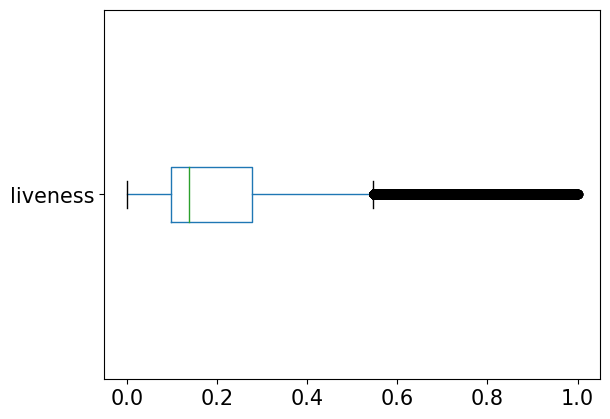

In [38]:
boxpolot_live= df_num.boxplot(column='liveness', grid=False, vert=False, fontsize=15)

In [39]:
mean= df_num['liveness'].mean()

q25,q75= np.nanpercentile(df_num['liveness'],[25,75])
iqr= np.subtract(q75,q25)
maximum= q75+ 1.5*iqr

print('mean:',mean)
print('maximum', maximum)

mean: 0.2138594899672236
maximum 0.5477000000000001


In [40]:
outliers= df_num[df_num['liveness']>maximum]
percentage_outlier= (len(outliers)/ len(df_num))*100


print('Outliers:',len(outliers))
print('Outlier Proportion:', percentage_outlier)

Outliers: 41008
Outlier Proportion: 6.975015605678935


Top charting songs tend to be polished studio recording rather than live recording, with mean liveness of 0.2139.
Of 587927 songs, around 7% of songs (41008 songs) had liveness more than 0.5477.

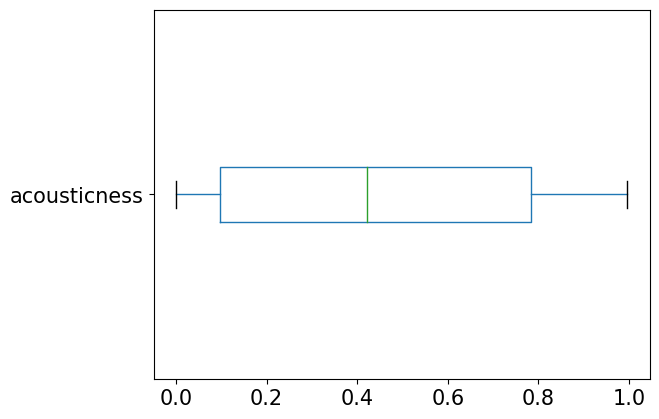

In [41]:
boxpolot_acoust= df_num.boxplot(column='acousticness', grid=False, vert=False, fontsize=15)

In [42]:
mean= df_num['acousticness'].mean()

q25,q75= np.nanpercentile(df_num['acousticness'],[25,75])
iqr= np.subtract(q75,q25)
minimum= q25- 1.5*iqr
maximum= q75+ 1.5*iqr

print('mean:',mean)
print('mode:', mode)
print('maximum', maximum)
print('minimum:', minimum)

mean: 0.4494427740691215
mode: 0    0.538
Name: energy, dtype: float64
maximum 1.81495
minimum: -0.93425


In [43]:
outliers_min= df_num[df_num['acousticness']<minimum]
outliers_max=df_num[df_num['acousticness']>maximum]

print('lower_outlier',len(outliers_min))
print('upper_outlier:', len(outliers_max))

lower_outlier 0
upper_outlier: 0


Top charting songs had mean acousticness of 0.44986. As seen by the plot and the mean closer to the center, there is only slight preference towards non-acoustic song.

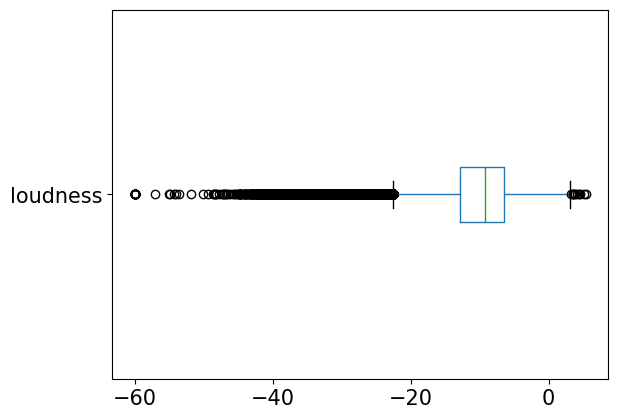

In [44]:
boxpolot_loud= df_num.boxplot(column='loudness', grid=False, vert=False, fontsize=15)

In [45]:
mean= df_num['loudness'].mean()
mode= df_num['loudness'].mode()
q25,q75= np.nanpercentile(df_num['loudness'],[25,75])
iqr= np.subtract(q75,q25)
maximum= q75+ 1.5*iqr
minimum= q25- 1.5*iqr

print('mean:',mean)
print('mode:', mode)
print('maximum', maximum)
print('minimum:', minimum)


mean: -10.1975214509383
mode: 0   -8.026
Name: loudness, dtype: float64
maximum 3.134000000000002
minimum: -22.490000000000002


In [46]:
outliers_min= df_num[df_num['loudness']<minimum]
outliers_max=df_num[df_num['loudness']>maximum]
percentage_lower_outlier= (len(outliers_min)/ len(df_num['loudness']))* 100
percentage_upper_outlier= (len(outliers_max)/ len(df_num['loudness']))*100

print('lower_outlier',len(outliers_min))
print('upper_outlier:', len(outliers_max))
print('percentage_lower_outlier', percentage_lower_outlier)
print('percentage_upper_outlier', percentage_upper_outlier)

lower_outlier 15154
upper_outlier: 10
percentage_lower_outlier 2.577530883936271
percentage_upper_outlier 0.0017008914372022377


Top charting songs tend to be loud, with mean loudness of -10.198 dB. Of 587927 songs, only around 2.57% of songs (15154 songs) had loudness quieter thaniveness more than -22.49 dB. This makes sense, given that the Spotify's loudness guideline is around -14 dB. There were also some minor outliers in the other end of extreme, with approximately 0.0017% of songs (10 songs) being louder than 3.13 dB.

### Visualizing Relationships Between Features

We have seen that there are observable patterns in individual features. We will explore if there are relationships between features. I'll categorize correlation between 0.4- 0.7 moderatcorrelation and those over 0.7 strong correlation. I will be rounding up correlations with aboslute values between 0.35- 0.4.

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'year'),
  Text(0, 2.5, 'danceability'),
  Text(0, 3.5, 'energy'),
  Text(0, 4.5, 'key'),
  Text(0, 5.5, 'loudness'),
  Text(0, 6.5, 'mode'),
  Text(0, 7.5, 'speechiness'),
  Text(0, 8.5, 'acousticness'),
  Text(0, 9.5, 'instrumentalness'),
  Text(0, 10.5, 'liveness'),
  Text(0, 11.5, 'valence'),
  Text(0, 12.5, 'tempo'),
  Text(0, 13.5, 'time_signature'),
  Text(0, 14.5, 'duration')])

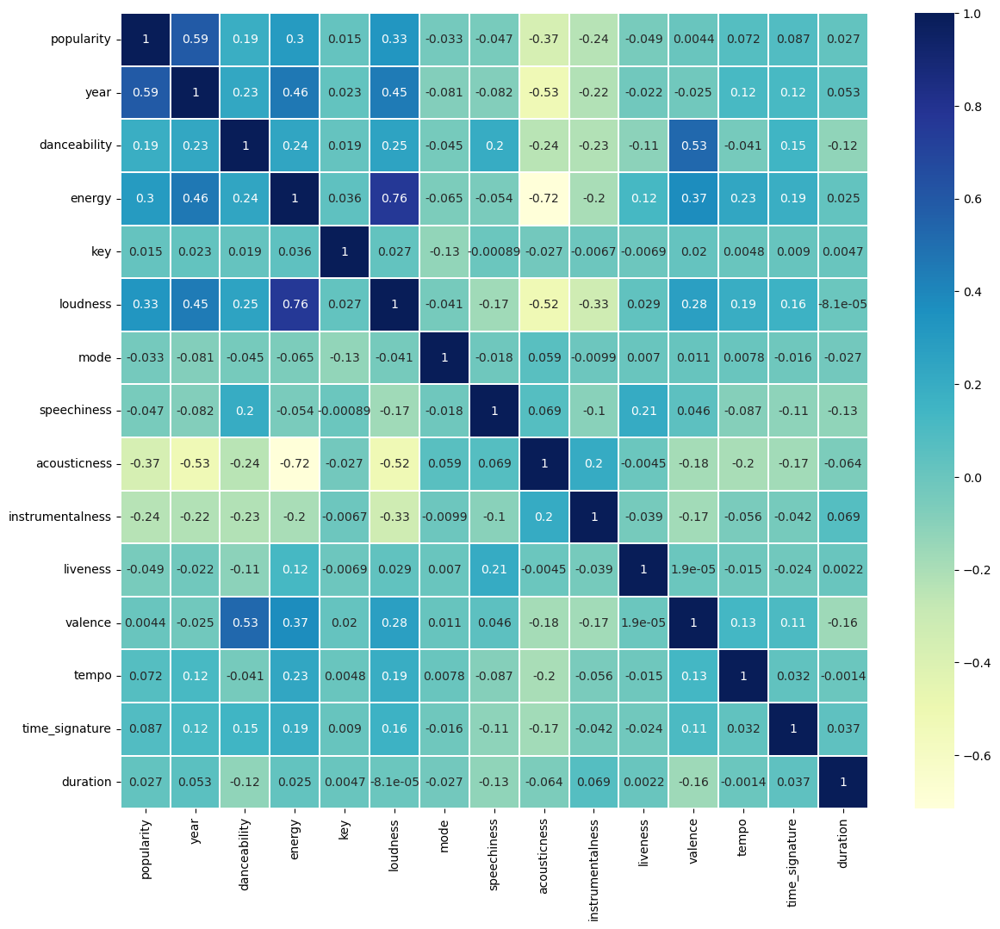

In [47]:
# Heatmap to visualize data relationships
plt.figure(figsize=(14,12))
sns.heatmap(df.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.yticks(rotation=0)

#### Strong positive correlations:
energy: loudness (0.76)

#### Moderate correlations:
valence: danceability (0.53)
<br> valence: energy(0.37)

#### Strong negative correaltions:
energy: acousticness (-0.72)

#### Moderate negative correlations:
loudness: acousticness (-0.52)
<br> acousticness: popularity (-0.37)



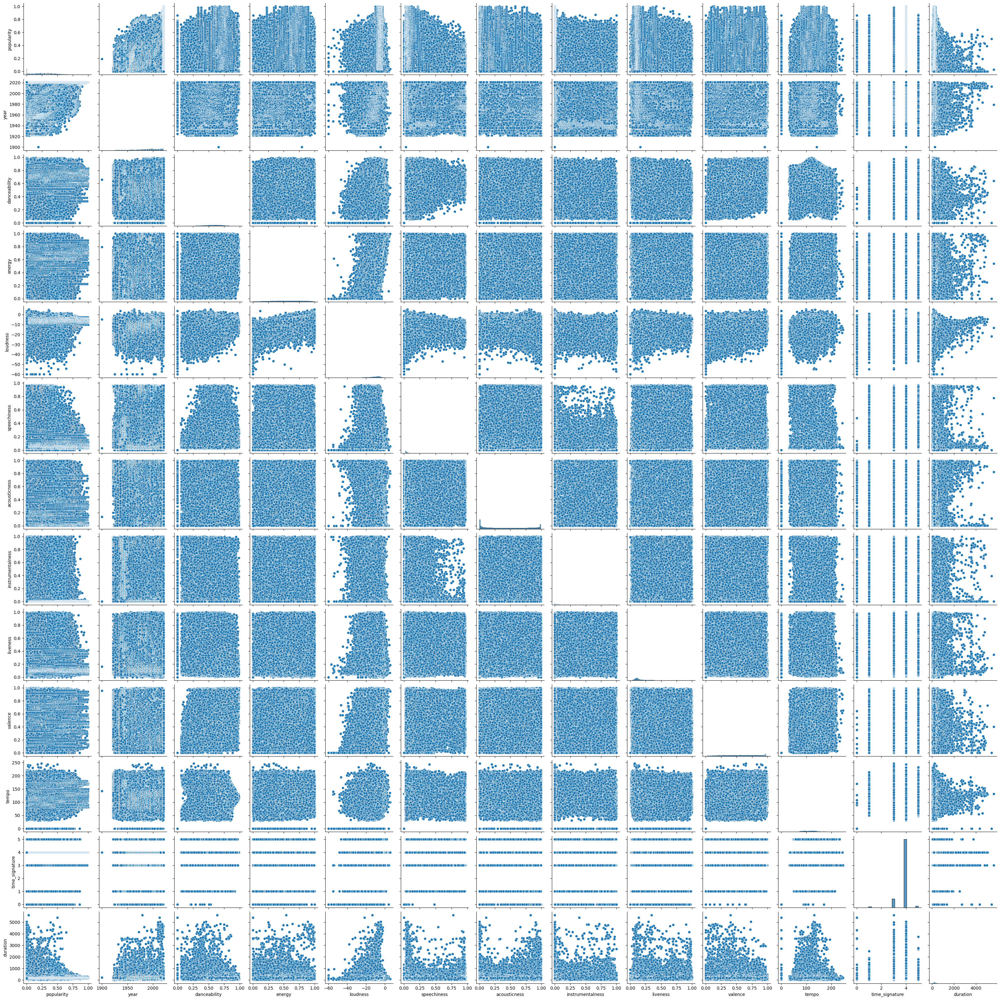

In [48]:
g= sns.pairplot(df_num, palette= 'Set1')
plt.show()

Not much correlation was seen in the data. This is to be expected, given how much music changes in a century. Let's try breaking down the data by year.

In [49]:
year_list= df_num['year'].unique().tolist()
year_list.sort()

data_year=[]
for i in range(len(year_list)):
    data_year.append(df_num[df_num['year']== year_list[i]])

In [50]:
len(data_year)

101

The earliest data we have is from 1900. While one may expect music from 1900 to be significantly different from 1922, let's examine it.

/Users/josephlim/opt/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/Users/josephlim/opt/anaconda3/lib/python3.9/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'danceability'),
  Text(0, 2.5, 'energy'),
  Text(0, 3.5, 'loudness'),
  Text(0, 4.5, 'speechiness'),
  Text(0, 5.5, 'acousticness'),
  Text(0, 6.5, 'instrumentalness'),
  Text(0, 7.5, 'liveness'),
  Text(0, 8.5, 'valence'),
  Text(0, 9.5, 'tempo'),
  Text(0, 10.5, 'time_signature'),
  Text(0, 11.5, 'duration')])

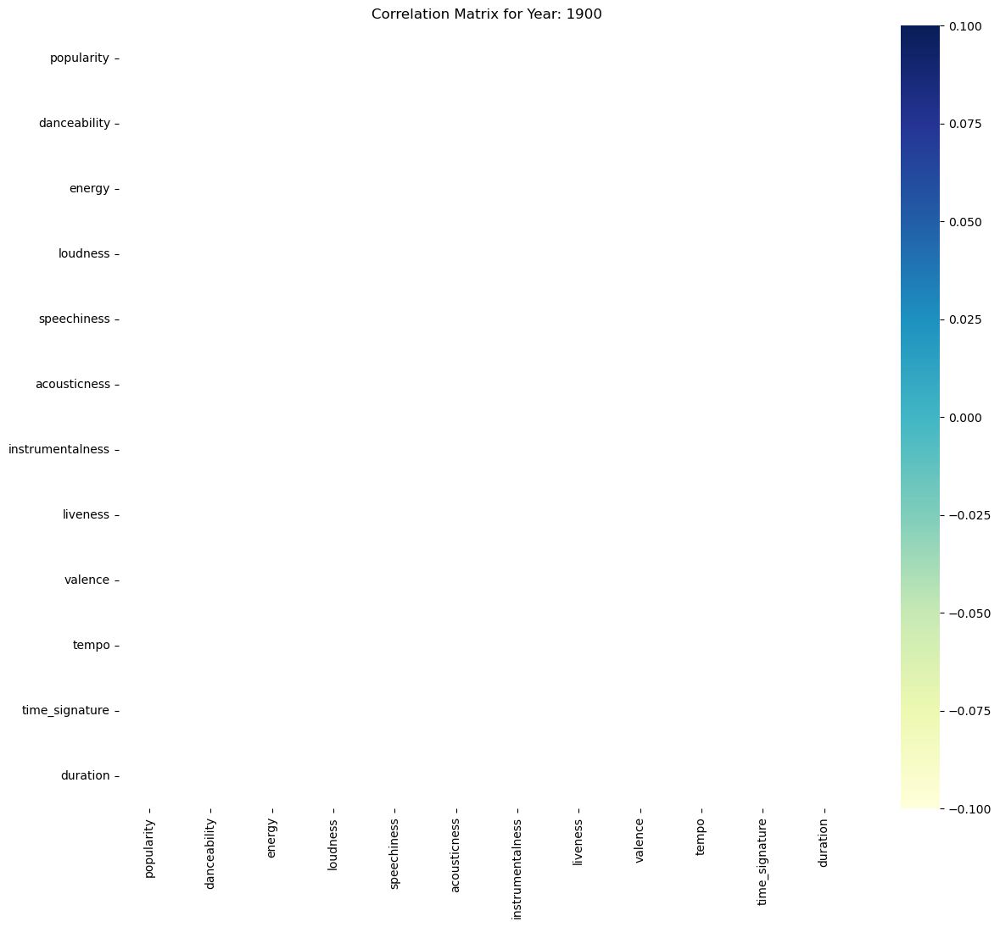

In [51]:
# Heatmap to visualize data relationships
# Heatmap to visualize data relationships
df_noyear=data_year[0].drop('year', axis=1)

plt.figure(figsize=(14,12))
sns.heatmap(df_noyear.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.title(label=f"Correlation Matrix for Year: {year_list[0]}")
plt.yticks(rotation=0)


It seems like there isn't much to dissect from 1900. This makes sense, because we only have one song from 1900. Onto the next year!

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 [Text(0, 0.5, 'popularity'),
  Text(0, 1.5, 'danceability'),
  Text(0, 2.5, 'energy'),
  Text(0, 3.5, 'loudness'),
  Text(0, 4.5, 'speechiness'),
  Text(0, 5.5, 'acousticness'),
  Text(0, 6.5, 'instrumentalness'),
  Text(0, 7.5, 'liveness'),
  Text(0, 8.5, 'valence'),
  Text(0, 9.5, 'tempo'),
  Text(0, 10.5, 'time_signature'),
  Text(0, 11.5, 'duration')])

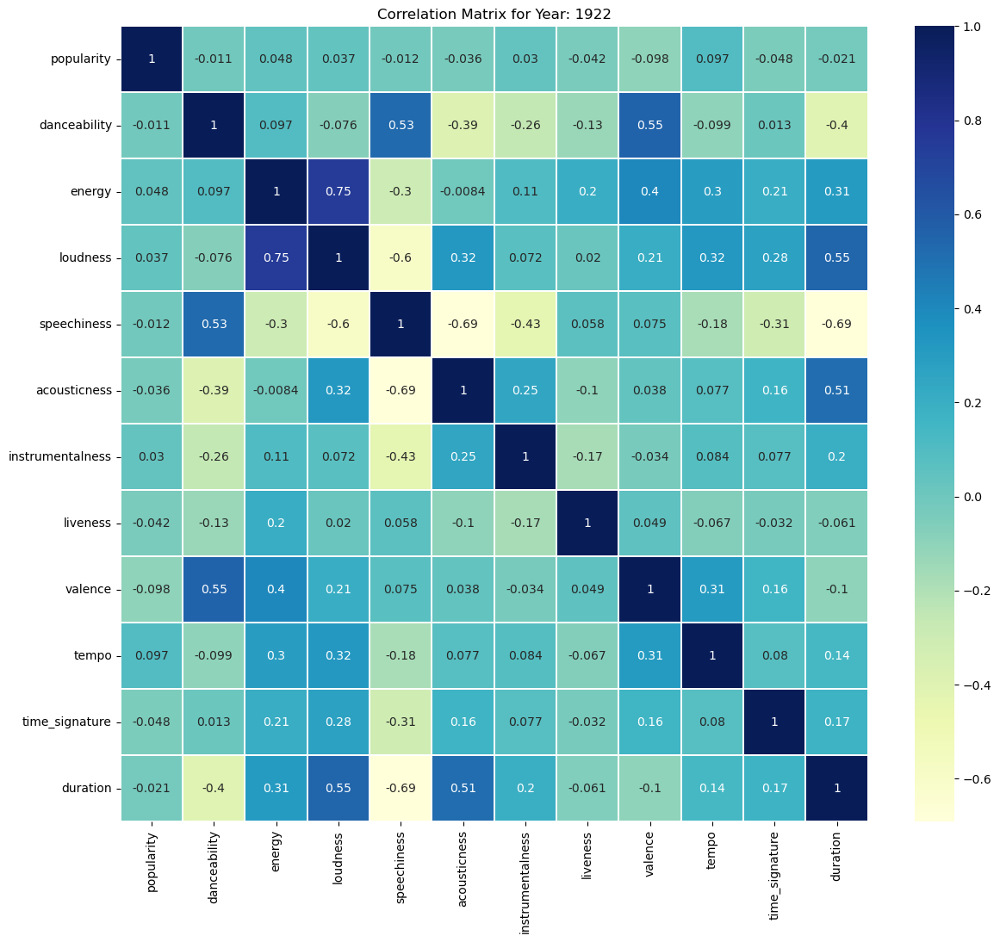

In [52]:
# Heatmap to visualize data relationships
df_noyear=data_year[1].drop('year', axis=1)

plt.figure(figsize=(14,12))
sns.heatmap(df_noyear.corr(), linewidths=.1, cmap='YlGnBu', annot=True)
plt.title(label=f"Correlation Matrix for Year: {year_list[1]}")
plt.yticks(rotation=0)

#### Strong positive correlations:
energy: loudness (0.75)

#### Moderate positive correlations:
loudness: duration (0.55)
<br> acousticness: duration (0.51)
<br> valence: danceability (0.55)
<br> speechiness: danceability (0.53)
<br> valence: energy(0.4)

#### Strong negative correaltions:
energy: acousticness (-0.72)

#### Moderate negative correlations:
loudness: acousticness (-0.52)
<br> acousticness: popularity (-0.37)




In [53]:
corr_mat=data_year[1].corr()
corr_mat

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,duration
popularity,1.000000,NaN,-0.011062,0.047754,0.037055,-0.011578,-0.036344,0.029931,-0.041826,-0.097501,0.097106,-0.048116,-0.021030
year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
danceability,-0.011062,NaN,1.000000,0.096760,-0.076078,0.527206,-0.387384,-0.260191,-0.130255,0.553361,-0.099361,0.013238,-0.401094
energy,0.047754,NaN,0.096760,1.000000,0.750777,-0.299850,-0.008380,0.106543,0.202934,0.400043,0.298440,0.205536,0.306251
loudness,0.037055,NaN,-0.076078,0.750777,1.000000,-0.597521,0.324189,0.071850,0.019648,0.205799,0.322382,0.278271,0.550389
speechiness,-0.011578,NaN,0.527206,-0.299850,-0.597521,1.000000,-0.691520,-0.427309,0.058025,0.074690,-0.177114,-0.313630,-0.687610
acousticness,-0.036344,NaN,-0.387384,-0.008380,0.324189,-0.691520,1.000000,0.252077,-0.101824,0.037827,0.076641,0.164150,0.513407
instrumentalness,0.029931,NaN,-0.260191,0.106543,0.071850,-0.427309,0.252077,1.000000,-0.169922,-0.034217,0.084066,0.077233,0.198971
liveness,-0.041826,NaN,-0.130255,0.202934,0.019648,0.058025,-0.101824,-0.169922,1.000000,0.048917,-0.067414,-0.032136,-0.061487
valence,-0.097501,NaN,0.553361,0.400043,0.205799,0.074690,0.037827,-0.034217,0.048917,1.000000,0.309427,0.157358,-0.100513


While it is nice to be able to visualize correlations, it will be a bit much to do so for 101 years of data. I'll simply extract features, correlation values, and year. 

In [54]:
df_corr_raw= pd.DataFrame(columns=['year','feature_1', 'feature_2', 'corr_value'])

for year in range(len(data_year)):

    corr_mat= data_year[year].corr()
    df_stack = corr_mat.stack().reset_index()
    
    #set column names
    df_stack.columns=['feature_1', 'feature_2', 'corr_value']
    df_stack.drop_duplicates(inplace=True)
    
    # Year
    df_stack['year']=year_list[year]
    
    df_corr_raw= df_corr_raw.append(df_stack)
    

df_corr_raw.reset_index()

,index,year,feature_1,feature_2,corr_value
0,0,1922,popularity,popularity,1.000000
1,1,1922,popularity,danceability,-0.011062
2,2,1922,popularity,energy,0.047754
3,3,1922,popularity,loudness,0.037055
4,4,1922,popularity,speechiness,-0.011578
...,...,...,...,...,...
14395,139,2021,duration,liveness,0.008630
14396,140,2021,duration,valence,-0.068777
14397,141,2021,duration,tempo,-0.019074
14398,142,2021,duration,time_signature,0.028558


In [55]:
df_corr_raw.shape

(14400, 4)

In [56]:
df_corr_raw['year'].unique()

array([1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932,
       1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943,
       1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020,
       2021], dtype=object)

In [57]:
# Make sure to sort before dropping duplicates based on tfidf values
df_raw_sorted= df_corr_raw.sort_values(['year','feature_1','feature_2']).reset_index().drop('index', axis=1)

# Will be vectorizing years and two features
pre_count= df_raw_sorted.copy()
pre_count['yr_str']=pre_count['year'].map(str)
pre_count['yr_feat_concat']= pre_count[['yr_str','feature_1','feature_2']].apply(" ".join, axis=1)

count_vect= CountVectorizer()
frq= pd.DataFrame(count_vect.fit_transform(pre_count['yr_feat_concat']))
pre_count['frq']= frq
pre_count['frq']=pre_count['frq'].map(str)

df_counted= pre_count.drop_duplicates(subset='frq', keep='first')

In [58]:
df_counted['year'].unique()

array([1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932,
       1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943,
       1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020,
       2021], dtype=object)

In [59]:
df_counted.shape

(7800, 7)

In [60]:
df_counted.head(200)

,year,feature_1,feature_2,corr_value,yr_str,yr_feat_concat,frq
0,1922,acousticness,acousticness,1.000000,1922,1922 acousticness acousticness,"(0, 0)\t1\n (0, 100)\t2"
1,1922,acousticness,danceability,-0.387384,1922,1922 acousticness danceability,"(0, 0)\t1\n (0, 100)\t1\n (0, 101)\t1"
2,1922,acousticness,duration,0.513407,1922,1922 acousticness duration,"(0, 0)\t1\n (0, 100)\t1\n (0, 102)\t1"
3,1922,acousticness,energy,-0.008380,1922,1922 acousticness energy,"(0, 0)\t1\n (0, 100)\t1\n (0, 103)\t1"
4,1922,acousticness,instrumentalness,0.252077,1922,1922 acousticness instrumentalness,"(0, 0)\t1\n (0, 100)\t1\n (0, 104)\t1"
...,...,...,...,...,...,...,...
333,1924,energy,tempo,0.082485,1924,1924 energy tempo,"(0, 103)\t1\n (0, 109)\t1\n (0, 2)\t1"
334,1924,energy,time_signature,0.149907,1924,1924 energy time_signature,"(0, 103)\t1\n (0, 110)\t1\n (0, 2)\t1"
335,1924,energy,valence,0.371884,1924,1924 energy valence,"(0, 103)\t1\n (0, 111)\t1\n (0, 2)\t1"
340,1924,instrumentalness,instrumentalness,1.000000,1924,1924 instrumentalness instrumentalness,"(0, 104)\t2\n (0, 2)\t1"


In [61]:
df_counted.columns

Index(['year', 'feature_1', 'feature_2', 'corr_value', 'yr_str',
       'yr_feat_concat', 'frq'],
      dtype='object')

In [62]:
df_counted= df_counted.drop([ 'yr_str', 'yr_feat_concat',
       'frq'],axis=1)

In [63]:
df_counted.head()

,year,feature_1,feature_2,corr_value
0,1922,acousticness,acousticness,1.000000
1,1922,acousticness,danceability,-0.387384
2,1922,acousticness,duration,0.513407
3,1922,acousticness,energy,-0.008380
4,1922,acousticness,instrumentalness,0.252077


In [64]:
corr_strength=[]
corr_value= df_counted['corr_value']

for i in corr_value:        
    # Correlation strength
    if (i>0.7)& (i !=1):
        strength= 'Strong Positive'
    elif (i <0.7) & (i>0.4):
        strength= 'Moderate Postive'
    elif (i< -0.7)& (i != -1):
        strength= 'Strong Negative'
    elif (i> -0.7) & (i< -0.4):
        strength= 'Moderate Negative'
    else:
        strength= 'Negligible'
    corr_strength.append(strength)

df_counted['corr_strength']= corr_strength
    

In [65]:
df_counted.shape

(7800, 5)

In [66]:
df_counted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7800 entries, 0 to 14399
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   year           7800 non-null   object 
 1   feature_1      7800 non-null   object 
 2   feature_2      7800 non-null   object 
 3   corr_value     7800 non-null   float64
 4   corr_strength  7800 non-null   object 
dtypes: float64(1), object(4)
memory usage: 365.6+ KB


In [67]:
df_nonneg= df_counted[df_counted['corr_strength']!='Negligible'].reset_index()
df_nonneg

,index,year,feature_1,feature_2,corr_value,corr_strength
0,2,1922,acousticness,duration,0.513407,Moderate Postive
1,8,1922,acousticness,speechiness,-0.691520,Moderate Negative
2,14,1922,danceability,duration,-0.401094,Moderate Negative
3,20,1922,danceability,speechiness,0.527206,Moderate Postive
4,23,1922,danceability,valence,0.553361,Moderate Postive
...,...,...,...,...,...,...
502,14296,2021,energy,instrumentalness,-0.429754,Moderate Negative
503,14298,2021,energy,loudness,0.771809,Strong Positive
504,14303,2021,energy,valence,0.446761,Moderate Postive
505,14310,2021,instrumentalness,loudness,-0.657338,Moderate Negative


In [68]:
df_21=df_nonneg[df_nonneg['year']==2021]
print(f"Total of {len(df_21)}")
df_21

Total of 8


,index,year,feature_1,feature_2,corr_value,corr_strength
499,14259,2021,acousticness,energy,-0.666855,Moderate Negative
500,14262,2021,acousticness,loudness,-0.543564,Moderate Negative
501,14279,2021,danceability,valence,0.402793,Moderate Postive
502,14296,2021,energy,instrumentalness,-0.429754,Moderate Negative
503,14298,2021,energy,loudness,0.771809,Strong Positive
504,14303,2021,energy,valence,0.446761,Moderate Postive
505,14310,2021,instrumentalness,loudness,-0.657338,Moderate Negative
506,14339,2021,loudness,valence,0.422393,Moderate Postive


In [69]:
df_20=df_nonneg[df_nonneg['year']==2020]
print(f"Total of {len(df_20)}")
df_20

Total of 3


,index,year,feature_1,feature_2,corr_value,corr_strength
496,14115,2020,acousticness,energy,-0.607018,Moderate Negative
497,14154,2020,energy,loudness,0.663502,Moderate Postive
498,14167,2020,instrumentalness,popularity,-0.415825,Moderate Negative


In [70]:
df_19=df_nonneg[df_nonneg['year']==2019]
print(f"Total of {len(df_19)}")
df_19

Total of 4


,index,year,feature_1,feature_2,corr_value,corr_strength
492,13971,2019,acousticness,energy,-0.612571,Moderate Negative
493,13974,2019,acousticness,loudness,-0.414983,Moderate Negative
494,14010,2019,energy,loudness,0.684709,Moderate Postive
495,14023,2019,instrumentalness,popularity,-0.429471,Moderate Negative


In [71]:
df_18=df_nonneg[df_nonneg['year']==2018]
print(f"Total of {len(df_18)}")
df_18

Total of 5


,index,year,feature_1,feature_2,corr_value,corr_strength
487,13827,2018,acousticness,energy,-0.639358,Moderate Negative
488,13830,2018,acousticness,loudness,-0.460460,Moderate Negative
489,13847,2018,danceability,valence,0.419890,Moderate Postive
490,13866,2018,energy,loudness,0.648662,Moderate Postive
491,13879,2018,instrumentalness,popularity,-0.452245,Moderate Negative


In [72]:
df_corr= df_counted[df_counted['corr_value']!=1].reset_index()

We might need 'neglibile' correlation values later. We'll keep them for now.

In [73]:
df_corr.shape

(6600, 6)

We will try to explore different combination between features and their correlation values. We will then try to explore if there is any pattern in correlation.

In [74]:
corr_feat= df_corr[['feature_1', 'feature_2']].apply(" ".join, axis=1)
df_corr['corr_feat']=corr_feat
df_corr['corr_feat']=df_corr['corr_feat'].str.title()

# Rearranging column orders
cols=['year', 'feature_1', 'feature_2', 'corr_feat','corr_value', 'corr_strength']
df_corr=df_corr[cols]

In [75]:
df_corr.head()

,year,feature_1,feature_2,corr_feat,corr_value,corr_strength
0,1922,acousticness,danceability,Acousticness Danceability,-0.387384,Negligible
1,1922,acousticness,duration,Acousticness Duration,0.513407,Moderate Postive
2,1922,acousticness,energy,Acousticness Energy,-0.008380,Negligible
3,1922,acousticness,instrumentalness,Acousticness Instrumentalness,0.252077,Negligible
4,1922,acousticness,liveness,Acousticness Liveness,-0.101824,Negligible


In [76]:
df_corr.columns

Index(['year', 'feature_1', 'feature_2', 'corr_feat', 'corr_value',
       'corr_strength'],
      dtype='object')

Let's make sure there isn't any different feature names that mean the same thing (i.e. acousticness vs. duration and duration vs. acousticness). Notice that we only removed duplicate features/correlation values before, which accomplished what we wanted as a byproduct. Also, while we have removed duplicate feature names before, we only did so in a single year. It can't hurt to check for duplicate feature names across different years. If there are any different feature names that mean the same thing, we should unify them.

In [77]:
corr_feat_sort= df_corr['corr_feat'].unique()
corr_feat_sort.sort()

In [78]:
len(corr_feat_sort)

66

In [79]:
feat_df=pd.DataFrame(corr_feat_sort)
feat_df=feat_df.astype(str)

feat_frq= pd.DataFrame(count_vect.fit_transform(feat_df[0]))
feat_frq.duplicated().any()

/Users/josephlim/opt/anaconda3/lib/python3.9/site-packages/pandas/core/base.py:1314: SparseEfficiencyWarning: Comparing sparse matrices using == is inefficient, try using != instead.
  return duplicated(self._values, keep=keep)


False

There seems to be common feature correlations that exist throughout years. Let's examine data from the past 10 years and identify them. Let's try taking averages of correlation values. 

In [80]:
past_ten= year_list[90:]
features=feat_df.iloc[:,0]

df_past10=df_corr.loc[df_corr['year'].isin(past_ten)]


avg_corr=pd.DataFrame(columns=['features','corrs_avg'])
corr_avg=[]


for i in range(len(features)):
    df=df_past10[df_past10['corr_feat']==features[i]]
    df=df.reset_index()
    
    corr_avg.append(df['corr_value'].mean())
        
avg_corr['corrs_avg']= corr_avg
avg_corr['features']= features

avg_corr

,features,corrs_avg
0,Acousticness Danceability,-0.168675
1,Acousticness Duration,-0.021965
2,Acousticness Energy,-0.668663
3,Acousticness Instrumentalness,-0.004347
4,Acousticness Liveness,-0.069110
...,...,...
61,Speechiness Time_Signature,0.031686
62,Speechiness Valence,0.080098
63,Tempo Time_Signature,0.045228
64,Tempo Valence,0.059261


In [81]:
avg_modstrong= avg_corr.loc[(avg_corr['corrs_avg']>0.5)|(avg_corr['corrs_avg']< -0.5)]
avg_modstrong

,features,corrs_avg
2,Acousticness Energy,-0.668663
32,Energy Loudness,0.703374


Acousticness/energy and energy/loudness pairs are also found here. This means popular songs the past ten years tend to have negative correlation between acousticness/energy and positive correlation between energy/ loudness.

Let's see if there are correlations in correlations between features and time. First we'll try to find correlations between correlations between *features correlation* and *time* throughout the entire dataset(called **correlation-time correlation** moving forward). We'll then focus and find correlation-time correlation* in data from the past ten years.

In [82]:
features=feat_df.iloc[:,0]
feat_time_corr=pd.DataFrame(columns=['features','corrs_across_years'])
pearson_list=[]
lessthan30=[]


for i in features:
    df=df_corr[df_corr['corr_feat']==i]
    df=df.reset_index()
    
    if len(df[df['corr_strength']!='Negligible'])<30:
        lessthan30.append(i)
    else:
        corr_mat= pearsonr(x=df['year'], y= df['corr_value'])
        pearson_list.append(corr_mat)
        
pearson_r=[a for a,b in pearson_list]
feat_time_corr['corrs_across_years']= pearson_r
feat_time_corr['features']= features

print(f"{len(lessthan30)} features have less than 30 non-negligible correlation values.")  

df_feat_filt=feat_time_corr.loc[(feat_time_corr['corrs_across_years']> 0.5) | (feat_time_corr['corrs_across_years']< -0.5)]
df_feat_filt

61 features have less than 30 non-negligible correlation values.


,features,corrs_across_years
0,Acousticness Danceability,-0.801864
1,Acousticness Duration,-0.794402


Overall, there is a strong negative correlation-time correlation in "Acousticness Danceability" and "Acousticness Duration". We'll now analyze the data the past ten years and see if we still see this features correlation after narrowing down the time frame. 

In [83]:
feat_conc= df_nonneg[['feature_1', 'feature_2']].apply(" ".join, axis=1)
df_nonneg['corr_feat']=feat_conc
df_nonneg['corr_feat']=df_nonneg['corr_feat'].str.title()

# Rearranging column orders
cols=['year', 'feature_1', 'feature_2', 'corr_feat','corr_value', 'corr_strength']
df_nonneg=df_nonneg[cols]

In [84]:
past_ten= year_list[90:]
features=feat_df.iloc[:,0]

correl_str=['Strong Positive', 'Strong Negative']

df_past10=df_corr.loc[df_corr['year'].isin(past_ten)]


past_ten_corr=pd.DataFrame(columns=['features','corrs_across_years'])
pearson_list=[]
lessthan5=[]


for i in features:
    df=df_past10[df_past10['corr_feat']==i]
    df=df.reset_index()
    
    if len(df[df['corr_strength']=='Negligible'])<5:
        lessthan5.append(i)
    
    else: 
        corr_mat= pearsonr(x=df['year'], y= df['corr_value'])
        pearson_list.append(corr_mat)
        
        
pearson_r=[a for a,b in pearson_list]
past_ten_corr['corrs_across_years']= pearson_r
past_ten_corr['features']= features


df_ten_filt=past_ten_corr.loc[(past_ten_corr['corrs_across_years']> 0.5) | (past_ten_corr['corrs_across_years']< -0.5)].reset_index(drop=True)

print(f"{len(lessthan5)} features have less than 5 non-negligible correlation values.")
print(f"{len(df_ten_filt)} features have more than 5 non-negligible correlation values.")

df_ten_filt

4 features have less than 5 non-negligible correlation values.
28 features have more than 5 non-negligible correlation values.


,features,corrs_across_years
0,Acousticness Instrumentalness,-0.513069
1,Acousticness Loudness,0.803688
2,Danceability Duration,-0.833761
3,Danceability Instrumentalness,0.618892
4,Danceability Liveness,0.648828
5,Danceability Loudness,0.823099
6,Danceability Popularity,0.812228
7,Danceability Speechiness,0.677108
8,Danceability Tempo,0.774237
9,Danceability Time_Signature,-0.627801


In [85]:
df_ten_filt['colors']=['green' if x > 0 else 'red' for x in df_ten_filt.corrs_across_years]

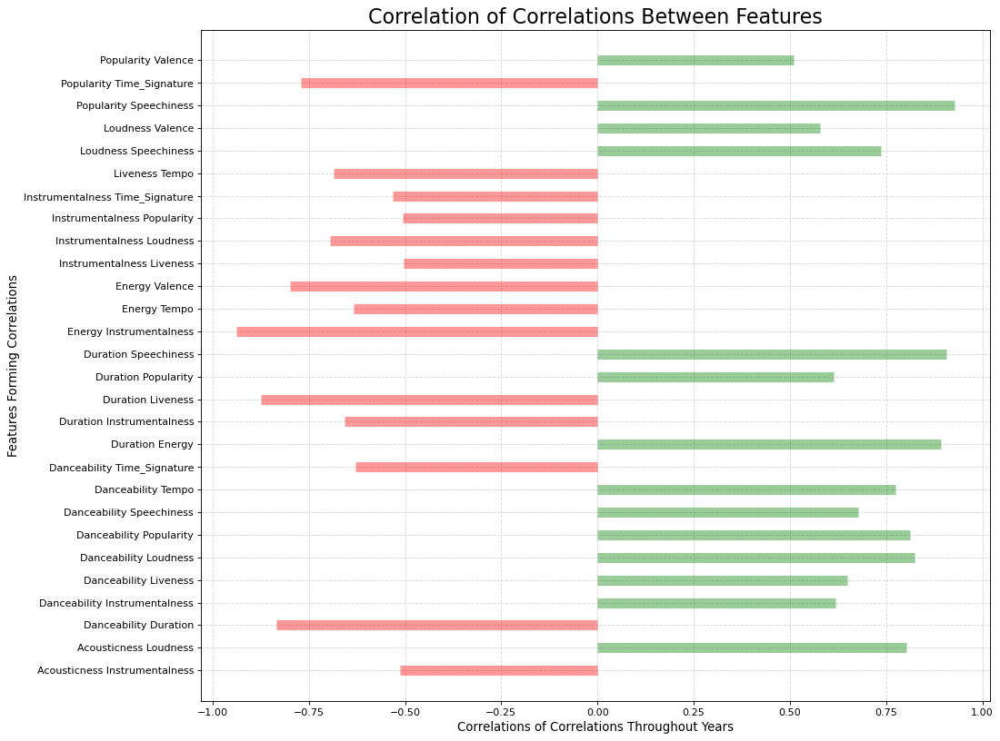

In [86]:
plt.figure(figsize=(14,12), dpi=80)
plt.hlines(y= df_ten_filt.features, xmin=0, xmax=df_ten_filt.corrs_across_years, 
           colors= df_ten_filt.colors, alpha=0.4, linewidth=10)
plt.xlabel('Correlations of Correlations Throughout Years',fontdict= {'size':12})
plt.ylabel('Features Forming Correlations', fontdict= {'size':12})
plt.title('Correlation of Correlations Between Features', fontdict= {'size':20})
plt.grid(linestyle='--', alpha=0.5)
plt.show()

Let's look at feature combinations with positive correlation with time.

In [87]:
df_ten_filt.drop(columns='colors', inplace=True)

In [88]:
df_ten_positive_mod = df_ten_filt.loc[df_ten_filt['corrs_across_years']<0.7]
df_ten_positive_mod

,features,corrs_across_years
0,Acousticness Instrumentalness,-0.513069
2,Danceability Duration,-0.833761
3,Danceability Instrumentalness,0.618892
4,Danceability Liveness,0.648828
7,Danceability Speechiness,0.677108
9,Danceability Time_Signature,-0.627801
11,Duration Instrumentalness,-0.657361
12,Duration Liveness,-0.873363
13,Duration Popularity,0.612686
15,Energy Instrumentalness,-0.937289


In [89]:
df_ten_positive= df_ten_filt.loc[df_ten_filt['corrs_across_years']>0.7]
print(len(df_ten_positive))
df_ten_positive

8


,features,corrs_across_years
1,Acousticness Loudness,0.803688
5,Danceability Loudness,0.823099
6,Danceability Popularity,0.812228
8,Danceability Tempo,0.774237
10,Duration Energy,0.891629
14,Duration Speechiness,0.905905
23,Loudness Speechiness,0.735424
25,Popularity Speechiness,0.926776


In [90]:
df_ten_positive['features'].unique()

array(['Acousticness Loudness', 'Danceability Loudness',
       'Danceability Popularity', 'Danceability Tempo', 'Duration Energy',
       'Duration Speechiness', 'Loudness Speechiness',
       'Popularity Speechiness'], dtype=object)

Let's look at feature combinations with negative correlation with time.

In [91]:
df_ten_neg= df_ten_filt.loc[df_ten_filt['corrs_across_years']<-0.5]
print(len(df_ten_neg))

14


In [92]:
df_ten_neg= df_ten_filt.loc[df_ten_filt['corrs_across_years']<-0.7]
print(len(df_ten_neg))
df_ten_neg

5


,features,corrs_across_years
2,Danceability Duration,-0.833761
12,Duration Liveness,-0.873363
15,Energy Instrumentalness,-0.937289
17,Energy Valence,-0.798457
26,Popularity Time_Signature,-0.770793


In [93]:
df_ten_neg['features'].unique()

array(['Danceability Duration', 'Duration Liveness',
       'Energy Instrumentalness', 'Energy Valence',
       'Popularity Time_Signature'], dtype=object)

In [94]:
past_ten= df_ten_filt['features'].unique()
past_hund= df_feat_filt['features'].unique()

comon_feat= set(past_ten).intersection(set(past_hund))

comon_feat

set()

Correlation-time correlation observed in the data from the past hundred years was not observed in the data from the past ten years.

## Correlations:
The initial findings from EDA revealed that the strongest correlation lies between energy and loudness (r=0.76). This makes intuitive sense, because loud music (i.e. hip hop and EDM) are associated with more energy.

<br> There is also moderate positive correlations between valence and danceability (r= 0.53). This also makes intuitive sense, as people are more likely to dance to "happy" or "fun" songs. Another positive correlation was seeen in valence and energy (r= 0.37). This also makes sense as those songs that convey "fun" emotions also tend to be more energetic. 

<br>There was a strong negative correlation between energy and acousticness (r= -0.72). This also makes intuitive sense, as acoustic versions of songs tend to be more relaxed in arrangement and overall texture/quality. This is further supported by moderate negative correlation between acousticness and loudness. More acoustic a song is, quieter it is. 

<br>There isn't any particular feature that has strong positive correlation with popularity. Energy and loudness have weak positive correlation with popularity, with r= 0.3 andr= 0.33, respectively. This makes sense as loud music is perceived to be better.There is also a moderate negative correlation between popularity and acousticness (-0.37). 

<br>However, it occured to me that the dataset is too large to identify valuable correlation, with years and 600,000 audio data through 100 years. As such, I separated the dataset separated by year and calculated correlation values between each feature. Particularly from the past four years, there seemed to be feature combinations with consistent non-negligible correlation.

<br> Upon deeper dive into the data, more relationships were revealed in different features.First approach taken was to take average of correlation values and only keep feature combinations with moderate average correlation values( -0.5< x ,0.5). Two combinations found were acousticness/energy and energy/loudness pairs, with -0.668899 and 0.704567, respectively. This means popular songs the past ten years tend to have negative correlation between acousticness/energy and positive correlation between energy/loudness.

<br> Furthermore, the correlation-time correlations were explored throughout the entire dataset. significant negative correlation-time correlation was observed in "Acousticness Danceability" and "Acousticness Duration". I then narrowed down to the past ten years of data to discover features with significant correlation-time correlations and see how it compares to those of the entire dataset.

<br>Data from 2011 to 2021 were filtered chosen, because it is as close to the present data as we could get. Twelve combinations had positive correlation over 0.5, with eight having strong positive correlation over 0.7. This included 'Acousticness Loudness', 'Danceability Loudness','Danceability Popularity', 'Danceability Tempo', 'Duration Energy', 'Duration Instrumentalness', 'Duration Speechiness', and 'Popularity Speechiness'. This means the said feature correlations are more likely to increase as years pass.
    
<br> There were also feature combinations with negative correlation-time correlation. Fourteen combinations had correlations less than -0.5, with six strong negative correlations less than -0.7. They included 'Danceability Duration', 'Duration Liveness','Energy Instrumentalness', 'Energy Valence','Loudness Speechiness', and 'Popularity Time_Signature'. This means the said feature correlations are more likely to decrease as years pass.

<br> There were no common high correlation-time correlation features with between the 2011-2021 data and the entire dataset.

In [95]:
df_m.to_csv('US_1921_2021_normalized.csv', index=False)